In [1]:
!pip install pytesseract
!pip install ultralytics
!sudo apt install tesseract-ocr
!pip install --upgrade azure-cognitiveservices-vision-computervision
!pip install azure-storage-blob azure-identity
!pip install label-studio
!pip install numpy --upgrade
!pip install python-dotenv
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.21.6-cp39-cp39-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.7 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.2
    Uninstalling numpy-1.24.2:
      Successfully uninstalled numpy-1.24.2
ERROR: pip's dependency resolver does 

In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import re
import pytesseract
from pytesseract import Output
import numpy as np
from PIL import ImageStat
from PIL import Image
import requests
from io import BytesIO
import math
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import glob
import time
import os
import urllib
import uuid
from azure.identity import DefaultAzureCredential
from azure.storage.blob import BlobServiceClient, BlobClient, ContainerClient, ContentSettings
from ultralytics import YOLO
from google.colab import files
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials
from dotenv import load_dotenv, find_dotenv
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [3]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install roboflow
from roboflow import Roboflow

Looking in indexes: https://download.pytorch.org/whl/cu118, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.3 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=1e33810535f75fa9fea4d6a8388c912163c8ada930bfe8a117268ff04aa680cd
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pypa

In [70]:
# load up the entries as environment variables
load_dotenv("/content/drive/MyDrive/container.env")

rf_key = os.environ.get("RF_KEY")

#paste your own Roboflow key or get it from your own .env file 
#rf_key="YOUR_ROBOFLOW_KEY_HERE"
rf = Roboflow(api_key=rf_key)

In [71]:
project = rf.workspace("asd-qzba1").project("container-wwejq")
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.82, to fix: `pip install ultralytics<=8.0.20`

Extracting Dataset Version Zip to container-2 in yolov8:: 100%|██████████| 858/858 [00:01<00:00, 477.96it/s]


In [69]:
rf.workspace("asd-qzba1").url

loading Roboflow workspace...


'asd-qzba1'

#Utforsker datasettet

In [46]:
img_adr = "/content/container-2/train/images/1-123126001-OCR-RF-D01_jpg.rf.1250b6573a6f0807a8146030f3d2fc53.jpg"
img_adr2 = "/content/container-2/train/images/1-123210001-OCR-AH-A01_jpg.rf.ff04e873814b28c4b9f3df45a8d12110.jpg"

In [7]:
test_images = []
test_images.append("/content/container-2/train/images/1-122720001-OCR-LB-C02_jpg.rf.131f6c9c5d0cbb4c093dc1bcf665423f.jpg")
test_images.append("/content/container-2/train/images/1-122816001-OCR-AS-B01_jpg.rf.6cde1108a9462328ac7f2ce266786723.jpg")
test_images.append("/content/container-2/train/images/1-123053001-OCR-AS-B01_jpg.rf.6c4708d4485a024f8533f186c8a74f82.jpg")
test_images.append("/content/container-2/train/images/1-123147001-OCR-AH-A01_jpg.rf.5ebd89523f900909cd4fdda6efc5f5d8.jpg")
test_images.append("/content/container-2/train/images/1-123210001-OCR-AS-B01_jpg.rf.cfa78e7ef951f953ef655647960ed9dd.jpg")
test_images.append("/content/container-2/train/images/1-123320001-OCR-AH-A01_jpg.rf.9224373b4209dc76e80b86bc8f51c51d.jpg")
test_images.append("/content/container-2/train/images/1-123407001-OCR-AH-A01_jpg.rf.7a32cacc41336143ca9b81526647aeed.jpg")
test_images.append("/content/container-2/train/images/1-123501001-OCR-AH-A01_jpg.rf.a06cad99a63aa2489b71af8aea5c6414.jpg")
test_images.append("/content/container-2/train/images/1-123638001-OCR-RF-D01_jpg.rf.3b34ba3b2d33ef1752eb29a8e82ecda3.jpg")
test_images.append("/content/container-2/train/images/1-123839001-OCR-AS-B01_jpg.rf.2de9dbb8a67f411ac3da58ecb870e463.jpg")

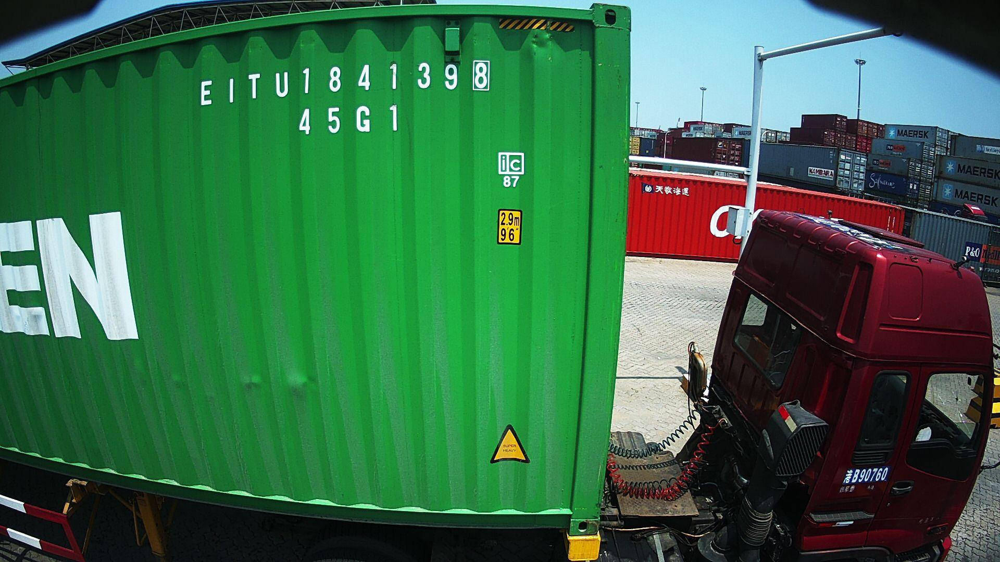

In [8]:
img = cv.imread(img_adr)
cv2_imshow(img)

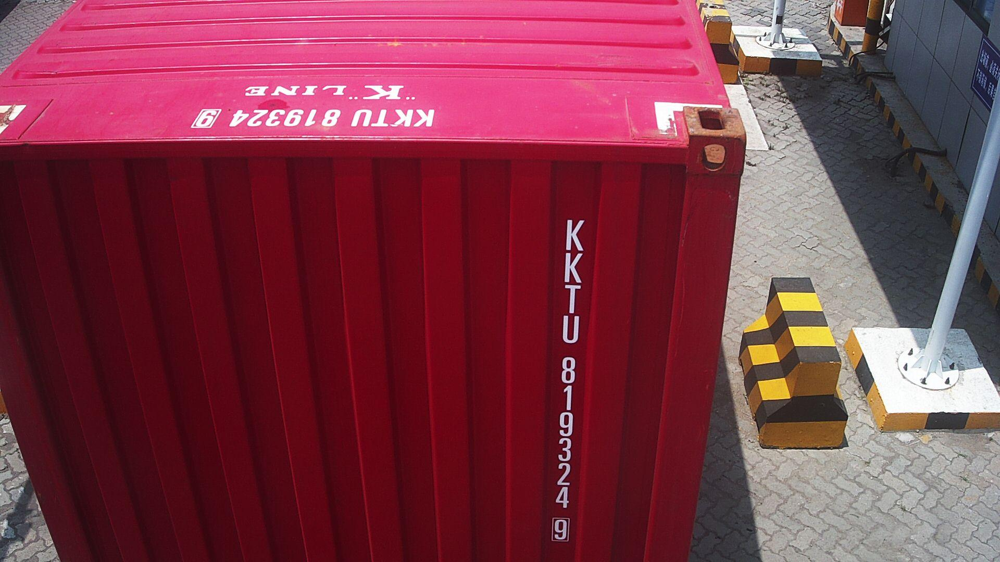

In [72]:
img2 = cv.imread(img_adr2)
cv2_imshow(img2)

#Tesseract fungerer best på tekstdokumenter, så metoder som får bilde til å bli så nærme svart/hvitt tekst som mulig er nødvendige. Mye prøving og feiling var nødvendig for å komme fram til verdiene for disse metodene.

In [18]:
def convert_greyscale(img):
  img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  return img

def invert(img):
    img = (255-img)
    return img

def opening(image):
    kernel = cv.getStructuringElement(cv.MORPH_RECT, (2,2))
    return cv.morphologyEx(image, cv.MORPH_OPEN, kernel)

def canny(image):
    return cv.Canny(image, 10, 20)

def median(img):
  blur = cv.medianBlur(img, 3)
  return blur

def gauss(img):
  blur = cv.GaussianBlur(img,(5,5),0)
  return blur

def bilateral(img):
  blur = cv.bilateralFilter(img,2,20,20)
  return blur

def otsu(img):
  ret,img = cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
  return img

def adaptive_mean(img):
  img = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,cv.THRESH_BINARY,11,2) 
  return img

def resize(img):
  scale_percent = 200 # percent of original size
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)
  resized = cv.resize(img, dim, interpolation = cv.INTER_AREA)
  return resized

def resize_2(img, scale_percent):
  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)
  resized = cv.resize(img, dim, interpolation = cv.INTER_AREA)
  return resized

def brightness_correction(img):
  cols, rows, z = img.shape
  brightness = np.sum(img) / (255 * cols * rows)
  minimum_brightness = 0.66 
  ratio = brightness / minimum_brightness
  if ratio >= 1:
    return img
  return cv.convertScaleAbs(img, alpha = 1 / ratio, beta = 0)

def fix_image_size(img):
  target = 50
  h = img.shape[0]
  w = img.shape[1]

  b = True

  if(h < target):
    scale = 50/h + 0.01
    h = h * scale
    w = w * scale
    b = False

  if(w < target):
    scale = 50/w + 0.01
    h = h * scale
    w = w * scale
    b = False

  if(not b):
    dim = (int(w), int(h))
    return cv.resize(img, dim, interpolation = cv.INTER_AREA)
    
  else:
    return img

#Dette er den kombinasjonene av steg som ser ut til å gi best resultater for nå.

In [42]:
def image_preprocess(img):
  img = resize(img)
  #img = brightness_correction(img)
  img = convert_greyscale(img)
  img = bilateral(img)
  #img = gauss(img)
  img = otsu(img)
  img = opening(img)
  #img = canny(img)
  img = invert(img)
  return(img)

1841398

45G1

EIT U

 

   

 

  
 



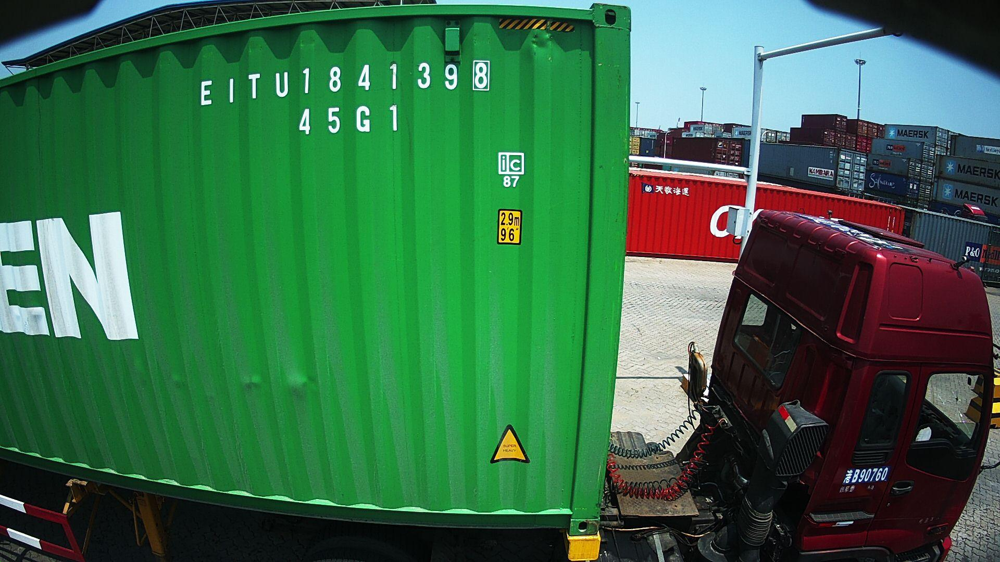

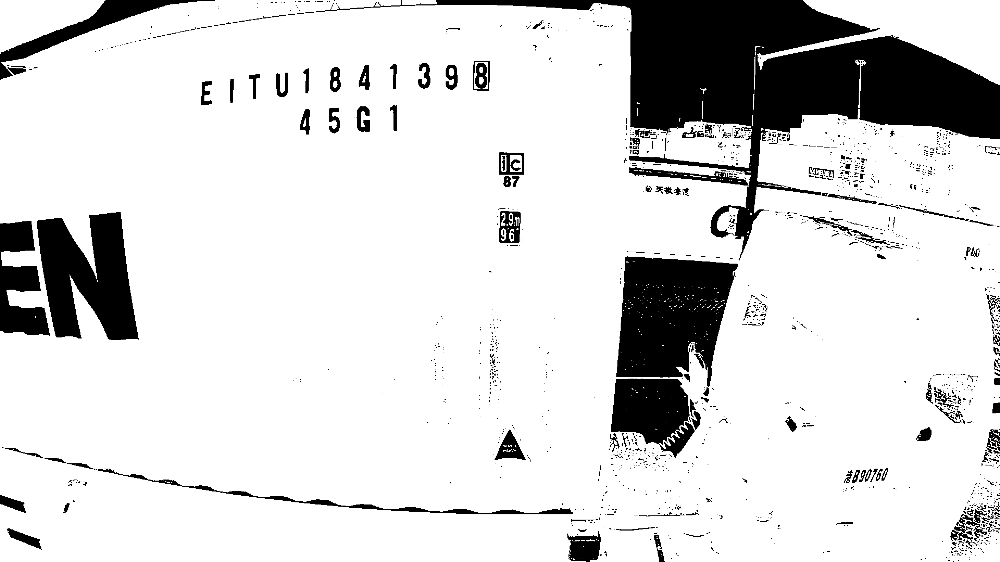

In [43]:
test_image = cv.imread(img_adr)

test_image_conv = image_preprocess(test_image)

boxes = pytesseract.image_to_boxes(test_image_conv)

custom_config = r'--psm 3'
s = pytesseract.image_to_string(test_image_conv, config= custom_config)

print(s)
h, w, c = test_image.shape

for b in boxes.splitlines():
  b = b.split(' ')
  test_image = cv.rectangle(test_image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

cv2_imshow(test_image)
cv2_imshow(test_image_conv)

4 ere ee a — _ tn a wooo No" & e 8 ee ite = Bey ol. fp ae 0 aan
PE le ; Fr ne oe ot a i; { / . '
MO ee S _ eee ee eee : :
in a a ae ; ; _ wee ee ee a aaa a aiaiemiaieciaeiamaaa Ying me a 2 si ed = icy I , .
Res Berry io’... - od a
an ; eer = - a ; aye yt 8 Pan } 6 :
. rine 7 ; ; i ——— ee a a eel eee Peel . a. Soa. . :
ae pn ad vy of ate a nd ee. Ba kN
7 a . - __ eee _. eee ; a - . yf Me :
aa . es — ——— ee a ee sas = =p i tft,
| ee * ed Fs rn fey th
i , coos tose ---). _ j See via
nena : nos ‘Oe a
aie, ny
; aor 4 we . %
a F toy en oe . w ane *
a ; fet a Sk |
- _ ‘on / a 2 —_ — + =~. z * a _
——— SS -
= ae
cal
- hie
K . ae
K esc
SRM ci .
, MS
| ars
g -_? " ORE ; a
. : |
| nf: a ; :
iB A
oat 6. ae orm
os: es ota he ; oe
a 3 * q Sa a Pop tg °
. Fi 7 : ime.
s . ca 5 :
rae 2
we ~ a
‘ 4
me Oe a se ;
a a3 ; ; . ‘
ta * A
| a 9]
ck, . ; ;
“a as . 7 _ aot



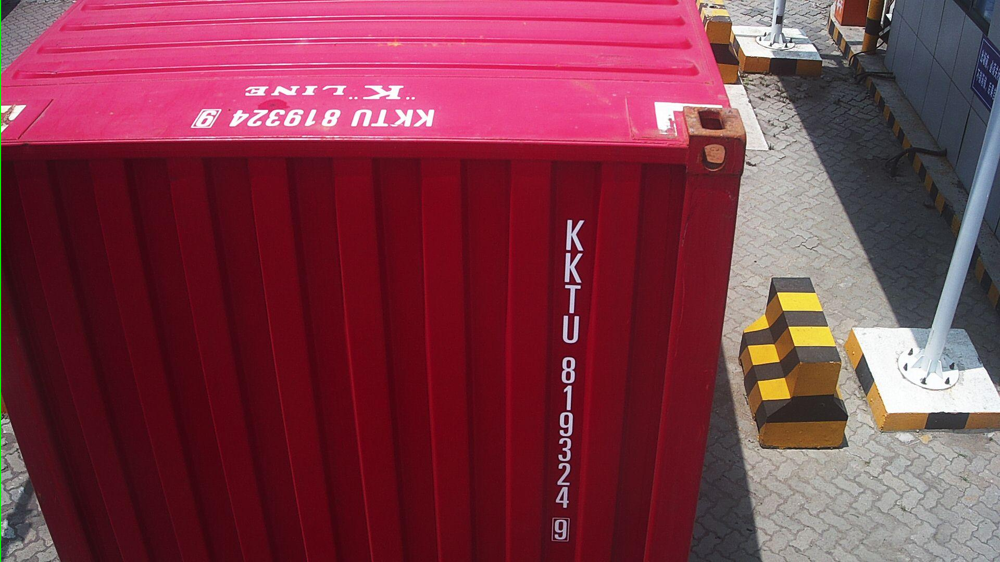

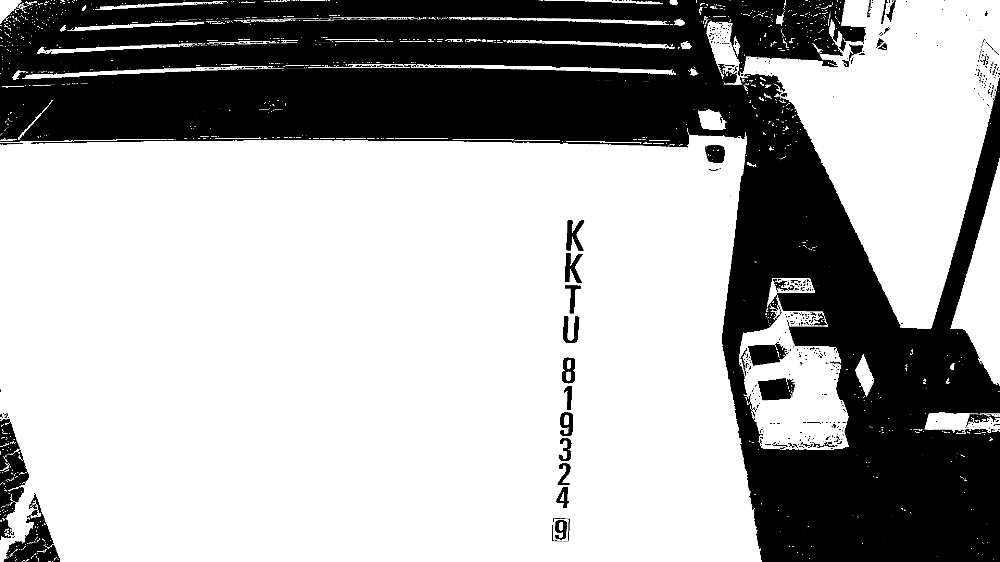

In [48]:
test_image = cv.imread(img_adr2)

test_image_conv = image_preprocess(test_image)

boxes = pytesseract.image_to_boxes(test_image_conv)

custom_config = r'--psm 6'
s = pytesseract.image_to_string(test_image_conv, config= custom_config)

print(s)
h, w, c = test_image.shape

for b in boxes.splitlines():
  b = b.split(' ')
  test_image = cv.rectangle(test_image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

cv2_imshow(test_image)
cv2_imshow(test_image_conv)

#Ikke dårlig på horisontal tekst, men nesten ubrukelig på vertikal tekst. Forksjellige lysforhold på containersidene gjør at thresholding fjerner den øverste koden. For at resultatene skal bli bedre må nok OCR utføres kun på det relevante området.

In [51]:
from pytesseract import Output

img = image_preprocess(cv.imread(img_adr2))

d = pytesseract.image_to_data(img, output_type=Output.DICT)
print(d.keys())

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


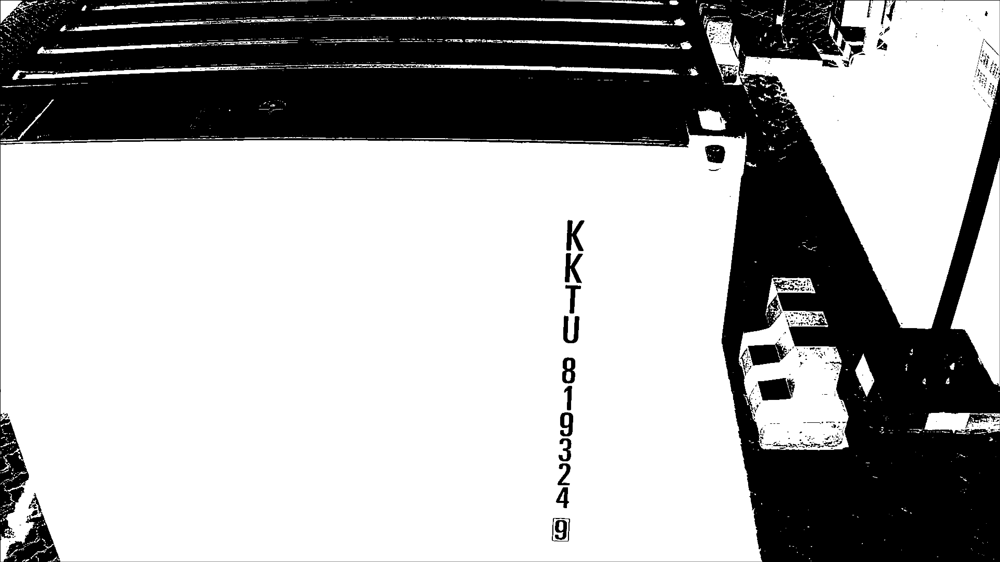

-1

In [52]:
n_boxes = len(d['text'])
for i in range(n_boxes):
    if int(d['conf'][i]) > 1:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        img = cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2_imshow(img)
cv.waitKey(0)

#Tesseract sin innebygde ord-detektor er ikke god nok, la oss heller trene opp en Object Detection modell for tekst deteksjon

In [56]:
# Load a model
model = YOLO('yolov8n.yaml')  # build a new model from YAML
model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights

# Train the model
#model.train(data='/content/container-2/data.yaml', epochs=20, imgsz=640, device='0')
model.train(data='/content/container-2/data.yaml', epochs=20, imgsz=640)
#mye raksere med GPU men, utskriften forsvant etter et crash og jeg var tom for Colab credits når jeg prøvde å kjøre den på nytt.


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.Conv                  [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.Conv                  [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.C2f                   [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.Conv                  [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.C2f                   [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.Conv                  [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.C2f                   [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.Conv                  [128

In [10]:
model = YOLO('/content/drive/MyDrive/SagaDetect/train4/weights/best.pt')

In [11]:
metrics = model.val()

Ultralytics YOLOv8.0.82 🚀 Python-3.9.16 torch-2.0.0+cu118 CPU
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
100%|██████████| 755k/755k [00:00<00:00, 15.3MB/s]
val: Scanning /content/container-2/valid/labels... 85 images, 0 backgrounds, 0 corrupt: 100%|██████████| 85/85 [00:00<00:00, 1262.04it/s]
val: New cache created: /content/container-2/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:21<00:00,  3.53s/it]
                   all         85        128      0.984          1      0.995      0.698
Speed: 4.7ms preprocess, 162.8ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


#Veldige gode resultater for tekst deteksjon

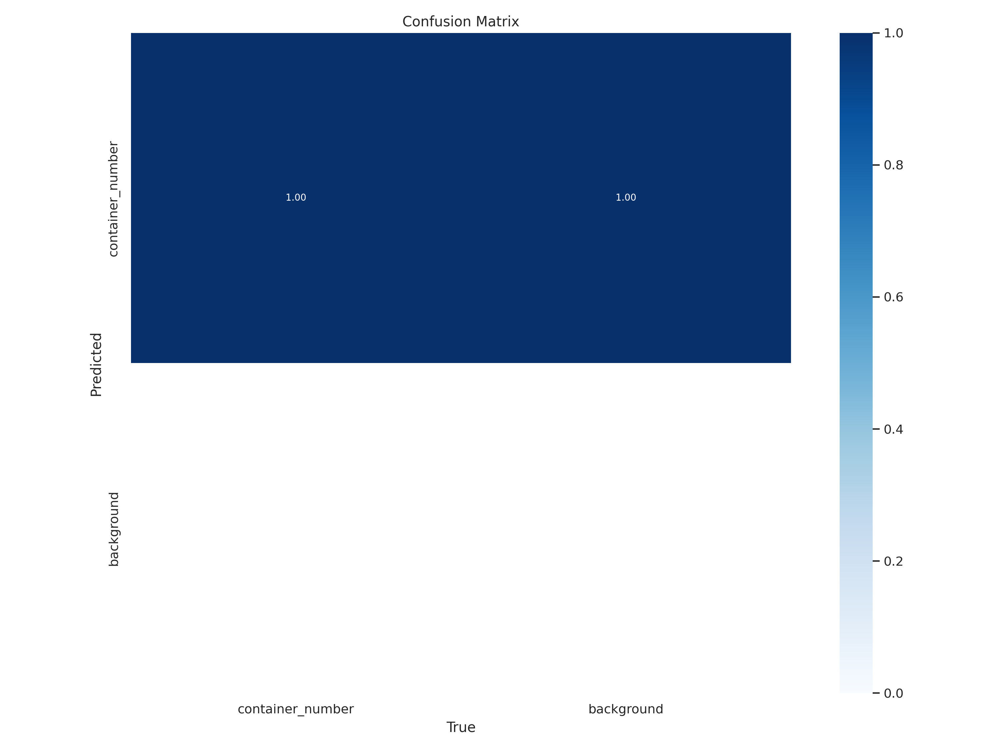

In [12]:
mat = Image.open("/content/drive/MyDrive/SagaDetect/train4/confusion_matrix.png")
mat


0: 384x640 1 container_number, 283.3ms
Speed: 1.5ms preprocess, 283.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


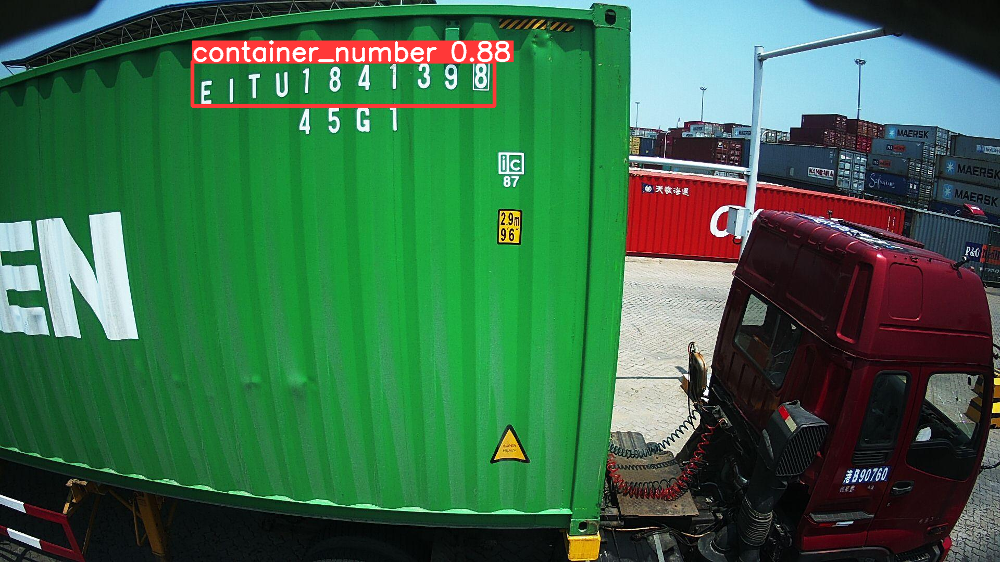

In [32]:
test_image = cv.imread(img_adr)
#test_image = cv.imread("/content/container-2/train/images/1-123210001-OCR-AH-A01_jpg.rf.ff04e873814b28c4b9f3df45a8d12110.jpg")
res = model.predict(test_image)
res_plotted = res[0].plot()
cv2_imshow(res_plotted)

In [14]:
res[0].boxes

WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


ultralytics.yolo.engine.results.Boxes object with attributes:

boxes: tensor([[1.0571e+03, 4.1814e+02, 1.1313e+03, 1.0441e+03, 8.2687e-01, 0.0000e+00],
        [3.5015e+02, 1.9867e+02, 8.5820e+02, 2.5678e+02, 6.0745e-01, 0.0000e+00]])
cls: tensor([0., 0.])
conf: tensor([0.8269, 0.6074])
data: tensor([[1.0571e+03, 4.1814e+02, 1.1313e+03, 1.0441e+03, 8.2687e-01, 0.0000e+00],
        [3.5015e+02, 1.9867e+02, 8.5820e+02, 2.5678e+02, 6.0745e-01, 0.0000e+00]])
id: None
is_track: False
orig_shape: tensor([1080, 1920])
shape: torch.Size([2, 6])
xywh: tensor([[1094.2229,  731.1351,   74.1461,  625.9951],
        [ 604.1703,  227.7244,  508.0504,   58.1077]])
xywhn: tensor([[0.5699, 0.6770, 0.0386, 0.5796],
        [0.3147, 0.2109, 0.2646, 0.0538]])
xyxy: tensor([[1057.1498,  418.1375, 1131.2959, 1044.1327],
        [ 350.1451,  198.6705,  858.1954,  256.7782]])
xyxyn: tensor([[0.5506, 0.3872, 0.5892, 0.9668],
        [0.1824, 0.1840, 0.4470, 0.2378]])

#Henter ut boksene fra resultater slik de kan brukes til cropping

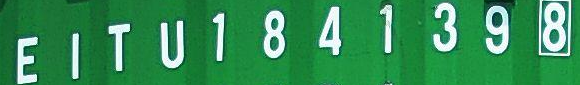

In [33]:
img = cv.imread(img_adr)
xyxy = res[0].boxes.xyxy.cpu()
xyxy = xyxy.numpy()
x1 = int(xyxy[0][0])
y1 = int(xyxy[0][1])
x2 = int(xyxy[0][2])
y2 = int(xyxy[0][3])
cropped_img = img[y1:y2, x1:x2]
cv2_imshow(cropped_img)

In [40]:
def crop_image(img, boxes):
  #xyxy = boxes.xyxy.cpu()
  #xyxy = xyxy.numpy()
  xyxy = boxes.xyxy.numpy()
  x1 = int(xyxy[0][0])
  y1 = int(xyxy[0][1])
  x2 = int(xyxy[0][2])
  y2 = int(xyxy[0][3])
  return img[y1:y2, x1:x2]

def crop_list(res):
  l = []
  for detection in res[0]:
    boxes = detection.boxes
    l.append(crop_image(detection.orig_img, boxes))
  return l


0: 384x640 1 container_number, 951.4ms
Speed: 6.8ms preprocess, 951.4ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


ej;TUI841398



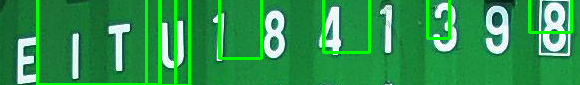

In [55]:
test_image = cv.imread(img_adr)

res = model.predict(test_image)

test_image = crop_image(test_image, res[0].boxes)

test_image_conv = image_preprocess(test_image)

boxes = pytesseract.image_to_boxes(test_image_conv)

custom_config = r'--psm 6'
s = pytesseract.image_to_string(test_image_conv, config= custom_config)

print(s)
h, w, c = test_image.shape

for b in boxes.splitlines():
  b = b.split(' ')
  test_image = cv.rectangle(test_image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

cv2_imshow(test_image)


0: 384x640 2 container_numbers, 141.9ms
Speed: 1.6ms preprocess, 141.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


K
K
T
U
8
1
g
3
2
4
Gi



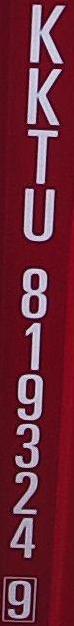

BB PEEGISE Nisin



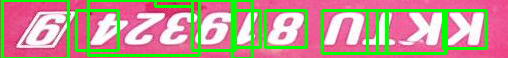

In [29]:
test_image_2 = cv.imread("/content/container-2/train/images/1-123210001-OCR-AH-A01_jpg.rf.ff04e873814b28c4b9f3df45a8d12110.jpg")

res = model.predict(test_image_2)

cropped_results = crop_list(res)

for crop_image in cropped_results:
  test_image_2_conv = image_preprocess(crop_image)

  boxes = pytesseract.image_to_boxes(crop_image)

  custom_config = r'--psm 6'
  s = pytesseract.image_to_string(test_image_2_conv, config= custom_config)

  print(s)
  h, w, c = crop_image.shape

  for b in boxes.splitlines():
    b = b.split(' ')
    crop_image = cv.rectangle(crop_image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

  cv2_imshow(crop_image)


0: 384x640 1 container_number, 218.9ms
Speed: 1.1ms preprocess, 218.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-122720001-OCR-LB-C02_jpg.rf.131f6c9c5d0cbb4c093dc1bcf665423f.jpg
FITUITS8639



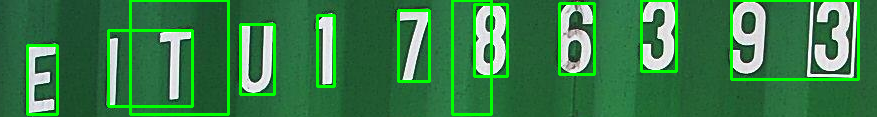

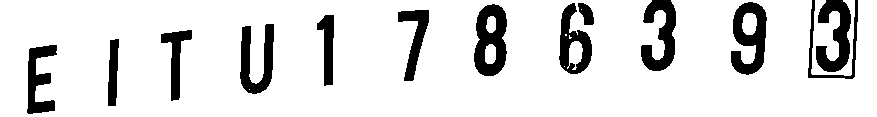


0: 384x640 1 container_number, 204.5ms
Speed: 1.6ms preprocess, 204.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-122816001-OCR-AS-B01_jpg.rf.6cde1108a9462328ac7f2ce266786723.jpg
MSCU 983672 3]



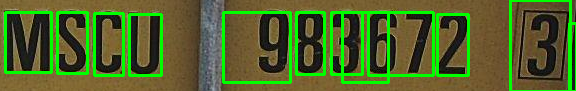

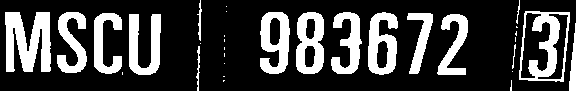


0: 384x640 2 container_numbers, 223.7ms
Speed: 2.6ms preprocess, 223.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123053001-OCR-AS-B01_jpg.rf.6c4708d4485a024f8533f186c8a74f82.jpg
DRYU 305554 §5)



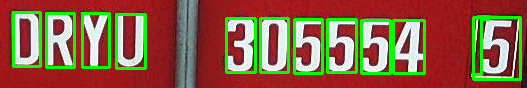

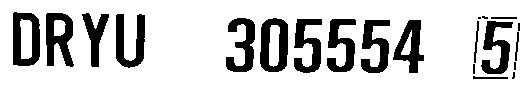

/content/container-2/train/images/1-123053001-OCR-AS-B01_jpg.rf.6c4708d4485a024f8533f186c8a74f82.jpg
ORYU 32058554 (5!



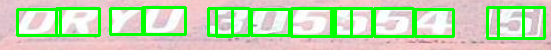

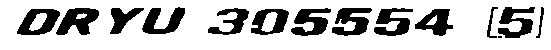


0: 384x640 2 container_numbers, 216.9ms
Speed: 1.7ms preprocess, 216.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123147001-OCR-AH-A01_jpg.rf.5ebd89523f900909cd4fdda6efc5f5d8.jpg
BSIU 3121 57.5).



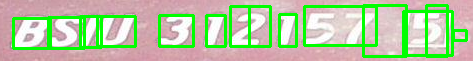

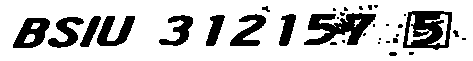

/content/container-2/train/images/1-123147001-OCR-AH-A01_jpg.rf.5ebd89523f900909cd4fdda6efc5f5d8.jpg
B
S
|
U
3
2
5
7
(5)



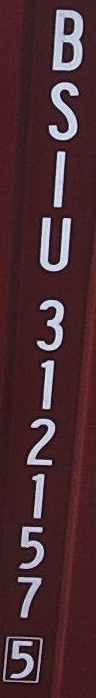

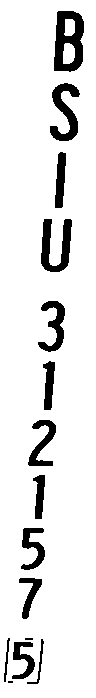


0: 384x640 2 container_numbers, 227.4ms
Speed: 1.6ms preprocess, 227.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123210001-OCR-AS-B01_jpg.rf.cfa78e7ef951f953ef655647960ed9dd.jpg
1G/ PZEGCLES ALN



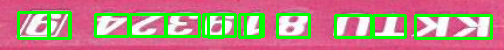

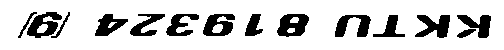

/content/container-2/train/images/1-123210001-OCR-AS-B01_jpg.rf.cfa78e7ef951f953ef655647960ed9dd.jpg
KKTU 819324 9



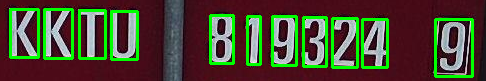

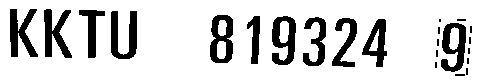


0: 384x640 2 container_numbers, 131.6ms
Speed: 1.6ms preprocess, 131.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123320001-OCR-AH-A01_jpg.rf.9224373b4209dc76e80b86bc8f51c51d.jpg
SO UME YM masta Psy



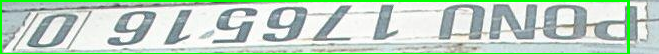

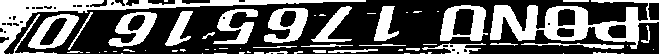

/content/container-2/train/images/1-123320001-OCR-AH-A01_jpg.rf.9224373b4209dc76e80b86bc8f51c51d.jpg
| PDR



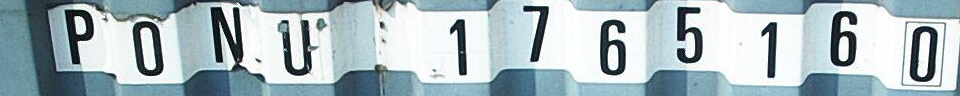

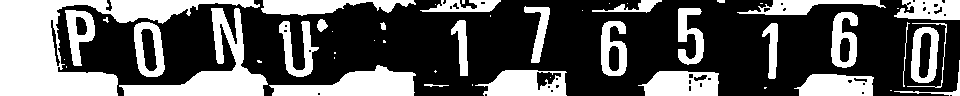


0: 384x640 2 container_numbers, 259.7ms
Speed: 3.7ms preprocess, 259.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123407001-OCR-AH-A01_jpg.rf.7a32cacc41336143ca9b81526647aeed.jpg
7TGHU G27862 |™



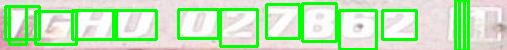

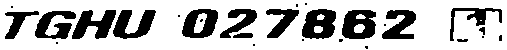

/content/container-2/train/images/1-123407001-OCR-AH-A01_jpg.rf.7a32cacc41336143ca9b81526647aeed.jpg
T
G
H
U
0
2
7
8
6
2
iT



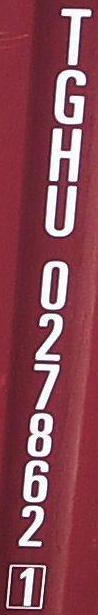

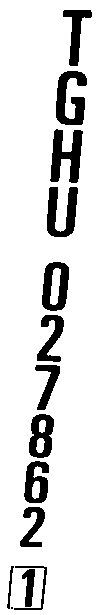


0: 384x640 1 container_number, 137.3ms
Speed: 4.2ms preprocess, 137.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123501001-OCR-AH-A01_jpg.rf.a06cad99a63aa2489b71af8aea5c6414.jpg
URE Saar



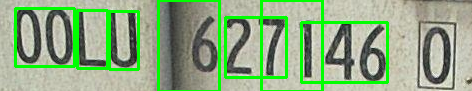

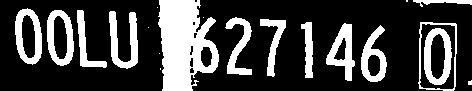


0: 384x640 1 container_number, 143.6ms
Speed: 1.6ms preprocess, 143.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123638001-OCR-RF-D01_jpg.rf.3b34ba3b2d33ef1752eb29a8e82ecda3.jpg
B
M
0
U
4
l
3
|
6
3



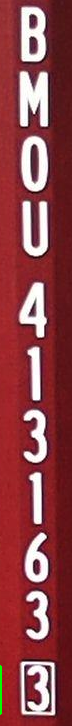

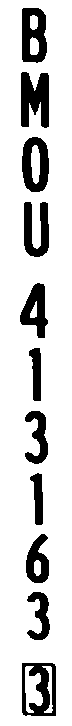


0: 384x640 2 container_numbers, 253.0ms
Speed: 7.1ms preprocess, 253.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


/content/container-2/train/images/1-123839001-OCR-AS-B01_jpg.rf.2de9dbb8a67f411ac3da58ecb870e463.jpg
MRKU: 713670 (7)



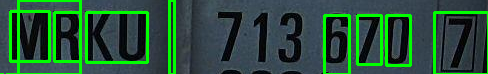

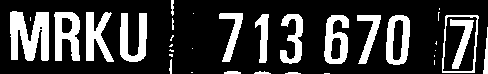

/content/container-2/train/images/1-123839001-OCR-AS-B01_jpg.rf.2de9dbb8a67f411ac3da58ecb870e463.jpg
VAT A? eo a foe ESD. at



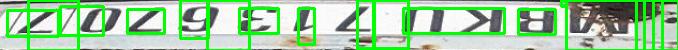

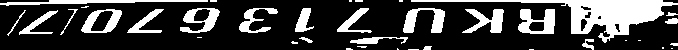

In [28]:
i = 0

for image_adr in test_images:
  test_image = cv.imread(image_adr)

  res = model.predict(test_image)

  cropped_results = crop_list(res)

  for image in cropped_results:

    image = fix_image_size(image)

    nopre = "/content/drive/MyDrive/SagaDetect/testfolder/" + str(i) + ".jpeg"
    cv.imwrite(nopre, image)

    test_image_conv = image_preprocess(image)

    i = i+1

    boxes = pytesseract.image_to_boxes(test_image_conv)

    custom_config = r'--psm 6'
    s = pytesseract.image_to_string(test_image_conv, config= custom_config)

    print(image_adr)
    print(s)
    h, w, c = image.shape

    for b in boxes.splitlines():
      b = b.split(' ')
      image = cv.rectangle(image, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)
    cv2_imshow(image)
    cv2_imshow(test_image_conv)

#Ikke dårlig, men litt upålitelig, det å skvise ut bedre resultater enn dette ville nok blitt et tilfelle av "diminishing returns" hvor mer nøyaktighet vil kreve eksponensielt mer og mer arbeid. Desverre så har vi på dette punktet ikke data som er lablet på en måte som lar oss ta i bruk den opprente modellen og vurdere nøyaktighet på OCR samtidig, så denne stikkprøven blir det beste vi har å gå på.